<a href="https://colab.research.google.com/github/rafawaltrick/Pandas/blob/main/mapas_e_graficos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 74.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 9.5 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 7.1.2
    Uninstalling click-7.1.2:
      Successfully uninstalled click-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.1.3 which is incompatible.


In [4]:
import pandas as pd
import datetime as dt
import geopandas as gpd
import folium
from shapely.geometry import Polygon, Point, LineString
%matplotlib inline
import matplotlib.pyplot as plt
plt.rc('figure', figsize = (15, 8))

In [5]:
dados_br = '/content/drive/MyDrive/Colab Notebooks/dados prot_amazonas/dados/brasil/BR_Pais_2021.shp'
dados_amazonia_bioma = '/content/drive/MyDrive/Colab Notebooks/dados prot_amazonas/dados/bioma amazonico/amazon_biome_border.shp'
dados_uc_am = '/content/drive/MyDrive/Colab Notebooks/dados prot_amazonas/dados/bioma amazonico/conservation_units_amazon_biome.shp'
dados_ti_am = '/content/drive/MyDrive/Colab Notebooks/dados prot_amazonas/dados/bioma amazonico/indigenous_area_amazon_biome.shp'

In [6]:
dfg_br = gpd.read_file(dados_br)
dfg_uc_am = gpd.read_file(dados_uc_am)
dgf_ti_am = gpd.read_file(dados_ti_am)
dfg_am_bioma = gpd.read_file(dados_amazonia_bioma)

In [7]:
# Para mostrar todos os dados do mapa e facilitar na visualização e renderização dos dados, vou utilizar um plugin do folium.
from folium.plugins import FastMarkerCluster
#Criando mapas de calor com o plugin HeatMap.
from folium.plugins import HeatMap

In [8]:
focos20_01_teste = '/content/drive/MyDrive/Colab Notebooks/dados prot_amazonas/dados/focos 2020/dfg_focos20_01.shp'

In [9]:
dfg_focos20_01 = gpd.read_file(focos20_01_teste)

In [10]:
dfg_focos20_01.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11802 entries, 0 to 11801
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   satelite    11802 non-null  object  
 1   pais        11802 non-null  object  
 2   estado      11802 non-null  object  
 3   municipio   11802 non-null  object  
 4   bioma       11802 non-null  object  
 5   diasemchuv  11802 non-null  float64 
 6   precipitac  11802 non-null  float64 
 7   riscofogo   11802 non-null  float64 
 8   latitude    11802 non-null  float64 
 9   longitude   11802 non-null  float64 
 10  frp         7444 non-null   float64 
 11  datahora_s  11802 non-null  object  
 12  geometry    11802 non-null  geometry
dtypes: float64(6), geometry(1), object(6)
memory usage: 1.2+ MB


In [11]:
dfg_focos20_01.datahora_s = pd.to_datetime(dfg_focos20_01.datahora_s)

In [16]:
def filtra_df(df, inicio = '2020/01/01', final = '2020/01/02'):
  """
  Função criada para filtrar o dataframe 
  que deve ser passado como parametro 
  no intervalo de datas que também 
  deve ser especificado pelo usuário
  considerando que a ultima data nao entra
  """
  #inicio = input('Digite a Data Inicial Desejada no formato "aaaa/mm/dd": ')
  #final = input('Digite a Dta Final Desejada no formato "aaaa/mm/dd": ')
  inicio = inicio
  final = final
  # A variavel data_inicio e data_final, servem para transformar as variaveis inicio e final, que são str, em datetime. Com a função date() para usar somente ano, mês, dia.
  data_inicio = dt.datetime.strptime(inicio, '%Y/%m/%d').date()
  data_final = dt.datetime.strptime(final, '%Y/%m/%d').date()

  df_filtrado = df[(df['datahora_s'].dt.date >= data_inicio) & (df['datahora_s'].dt.date < data_final)]#.estado.value_counts()
  return df_filtrado

In [27]:
def gera_mapa(df):
  dfg_focos20_01 = df
  media_lat = dfg_focos20_01['latitude'].mean()
  media_lon = dfg_focos20_01['longitude'].mean()

  #A variavel data_inicio e data_final, servem para transformar as variaveis inicio e final, que são str, em datetime. Com a função date() para usar somente ano, mês, dia.

  mapa = folium.Map(zoom_start = 5, location = [media_lat, media_lon])
  folium.TileLayer('cartodbpositron').add_to(mapa)

 

  #Adicionar as fronteiras do bioma. Trocar o estilo através do 'style_function'.
  limites = folium.GeoJson(dfg_am_bioma,
                         style_function = lambda feture: {
                             'color': 'black',
                             #tamanho
                             'weight': 2,
                             #opacidade
                             'fillOpacity': 0.0
                         })
  
  mapa.add_child(limites)

  mc = FastMarkerCluster(dfg_focos20_01[['latitude', 'longitude']])
  
  mapa.add_child(mc)

  
  return mapa

In [18]:
def gera_graficos(df):
  df_intervalo = df
 
  area = plt.figure(figsize = (20, 6))

 
  grafico1 = area.add_subplot(1, 2, 1)
  grafico1 = df_intervalo.estado.value_counts().plot.bar(color = 'orange')
  plt.title('Queimadas por Estado no Bioma Amazônico Entre 2020 e 2022.')
  plt.xlabel('Estados')
  plt.ylabel('Quantidade de focos')


  grafico2 = area.add_subplot(1, 2, 2)
  grafico2 = df_intervalo.estado.value_counts().plot.pie()
  plt.title('Queimadas por Estado no Bioma Amazônico Entre 2020 e 2022.')
  plt.xlabel('Estados')
  plt.ylabel('Quantidade de focos')


In [30]:
def gera_graficos_variaveis1(df: object, dados: str, tipo_grafico: str):
  df_intervalo = df
  area = plt.figure(figsize = (12, 8))
  cria_grafico = area.add_subplot(1, 1, 1)

  if dados == "municipio":
    if tipo_grafico == 'pie':
      cria_grafico = df_intervalo.municipio.value_counts().plot.pie()
    else:
      cria_grafico = df_intervalo.municipio.value_counts().plot.bar()
  elif dados == "estado":
    if tipo_grafico == 'pie':
      cria_grafico = df_intervalo.estado.value_counts().plot.pie()
    else:
      cria_grafico = df_intervalo.estado.value_counts().plot.bar()
  elif dados == "pais":
    if tipo_grafico == 'pie':
      cria_grafico = df_intervalo.pais.value_counts().plot.pie()
    else:
      cria_grafico = df_intervalo.pais.value_counts().plot.bar()
  elif dados == "bioma":
    if tipo_grafico == 'pie':
      cria_grafico = df_intervalo.bioma.value_counts().plot.pie()
    else:
      cria_grafico = df_intervalo.bioma.value_counts().plot.bar() 
  else:
    return "Local desconhecido."

In [29]:
#Tentei usar a função 'eval()' mas não obtive sucesso.
# A função 'eval()' 'transforma' um string em código. Tornando possível o usa da mesma no código.


def gera_graficos_variaveis2(df: object, dados: str, tipo_grafico: str):
  df_intervalo = df
 
  grafico = 'plot.' + tipo_grafico
  area = plt.figure(figsize = (20, 6))

 
  grafico1 = area.add_subplot(1, 1, 1)
  grafico1 = df_intervalo.eval(dados).value_counts().eval(grafico)()
 

In [31]:
# Busquei ajuda com o Otávio e ele desenvolveu o código abaixo. 
# Dessa forma ele usou a função apenas uma vez em uma string inteira.
# Ele criou uma variável em formato de str trazendo os dados dos agumentos da função 'gera_graficos_variaveis' e com a variável 'gera_grafico' usou a função 'eval()' para transformar em código e assim tornar executável a função principal.


def gera_graficos_variaveis3(df, dados, tipo_grafico):
  df_intervalo = df
  area = plt.figure(figsize = (12, 8))
  cria_grafico = area.add_subplot(1, 1, 1)
  expressao = f'df_intervalo.{dados}.value_counts().plot.{tipo_grafico}()'
  cria_grafico = eval(expressao)
  

In [49]:
def gera_graficos_variaveis(df, dados, tipo_grafico):
  df_intervalo = df
  area = plt.figure(figsize = (12, 8))
  cria_grafico = area.add_subplot(1, 1, 1)
  expressao = f'df_intervalo.{dados}.value_counts().plot.{tipo_grafico}()'
      
  plt.title(f'Queimadas por {dados.capitalize()} no Bioma Amazônico.')
  plt.xlabel(f'{dados.capitalize()}')
  plt.ylabel('Quantidade de focos')

  cria_grafico = eval(expressao)

In [22]:
df_intervalo = filtra_df(dfg_focos20_01, final='2020/01/03')

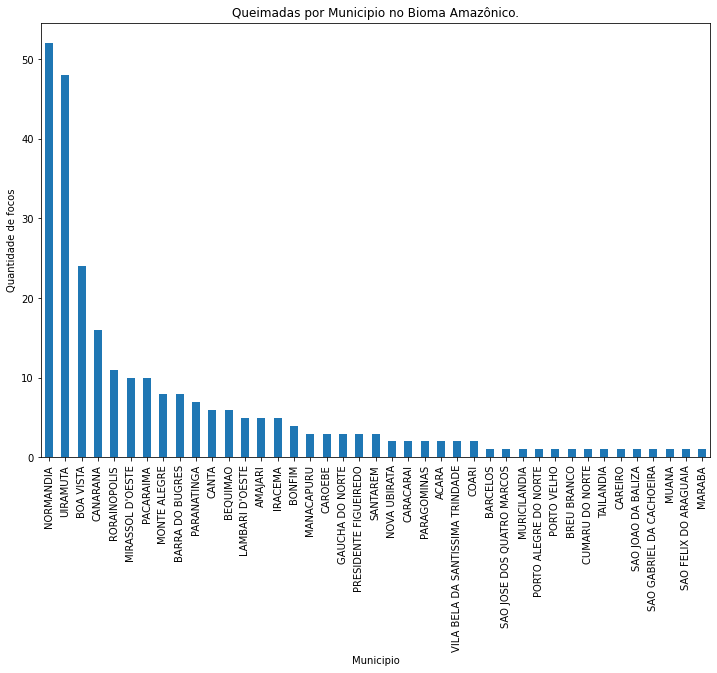

In [50]:
gera_graficos_variaveis(df_intervalo, 'municipio', 'bar')

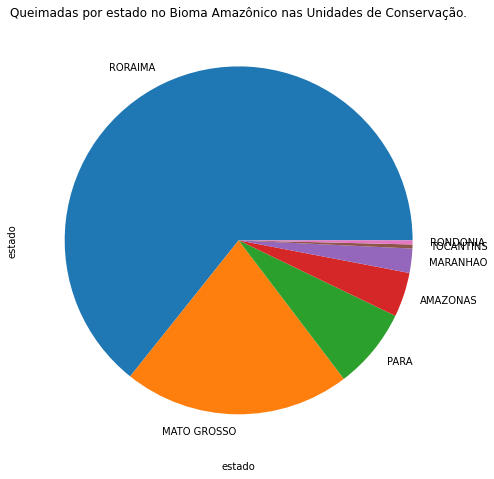

In [34]:
gera_graficos_variaveis(df_intervalo, 'estado', 'pie')

In [28]:
gera_mapa(df_intervalo)